In [1]:
import numpy as np
import pandas as pd
import re

C:\Users\Arun\AppData\Roaming\Python\Python38\site-packages\pandas\core\computation\expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_csv('gurgaon_properties_cleaned1.csv')


In [4]:
df.duplicated().sum()

121

In [5]:
df.head(1)


,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features
0,flat,kiran residency,sector 56,1.54,8324.0,1850.0,Super Built up area 2000(185.81 sq.m.)Built Up...,3,4,3+,Servant Room,5.0,South,10+ Year Old,"['Sector metro station', 'Sector metro station...","['3 Wardrobe', '5 Fan', '1 Exhaust Fan', '3 Ge...","['Feng Shui / Vaastu Compliant', 'Lift(s)', 'H..."


In [6]:
df[['area','areaWithType']]

,area,areaWithType
0,1850.0,Super Built up area 2000(185.81 sq.m.)Built Up...
1,277.0,Plot area 33(27.59 sq.m.)
2,11000.0,Carpet area: 11000 (1021.93 sq.m.)
3,2605.0,Super Built up area 2605(242.01 sq.m.)Built Up...
4,1930.0,Super Built up area 1930(179.3 sq.m.)Built Up ...
5,1671.0,Super Built up area 1671(155.24 sq.m.)Built Up...
6,1736.0,Super Built up area 1741(161.74 sq.m.)Built Up...
7,2685.0,Carpet area: 2685 (249.44 sq.m.)
8,1852.0,Super Built up area 1852(172.06 sq.m.)
9,NaN,Plot area 350(292.64 sq.m.)


In [7]:
def get_super_built_up_area(text):
    match = re.search(r'Super Built up area (\d+\.?\d*)', text)
    if match:
        return float(match.group(1))
    return None

In [8]:
def get_area(text, area_type):
    match = re.search(area_type + r'\s*:\s*(\d+\.?\d*)', text)
    if match:
        return float(match.group(1))
    return None

In [9]:
def convert_to_sqft(text, area_value):
    if area_value is None:
        return None
    match = re.search(r'{} \((\d+\.?\d*) sq.m.\)'.format(area_value), text)
    if match:
        sq_m_value = float(match.group(1))
        return sq_m_value * 10.7639 
    return area_value

In [10]:
df['super_built_up_area'] = df['areaWithType'].apply(get_super_built_up_area)
df['super_built_up_area'] = df.apply(lambda x: convert_to_sqft(x['areaWithType'], x['super_built_up_area']), axis=1)


In [11]:
df['built_up_area'] = df['areaWithType'].apply(lambda x: get_area(x, 'Built Up area'))
df['built_up_area'] = df.apply(lambda x: convert_to_sqft(x['areaWithType'], x['built_up_area']), axis=1)

In [12]:
df['carpet_area'] = df['areaWithType'].apply(lambda x: get_area(x, 'Carpet area'))
df['carpet_area'] = df.apply(lambda x: convert_to_sqft(x['areaWithType'], x['carpet_area']), axis=1)

In [13]:
df.head(
)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area
0,flat,kiran residency,sector 56,1.54,8324.0,1850.0,Super Built up area 2000(185.81 sq.m.)Built Up...,3,4,3+,Servant Room,5.0,South,10+ Year Old,"['Sector metro station', 'Sector metro station...","['3 Wardrobe', '5 Fan', '1 Exhaust Fan', '3 Ge...","['Feng Shui / Vaastu Compliant', 'Lift(s)', 'H...",2000.0,1900.0,1850.0
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.),1,1,0,not available,1.0,NaN,1 to 5 Year Old,NaN,[],NaN,NaN,NaN,NaN
2,flat,m3m golfestate,sector 65,13.20,12000.0,11000.0,Carpet area: 11000 (1021.93 sq.m.),4,4,3,Servant Room,13.0,North,5 to 10 Year Old,"['Sector 54 Chowk Metro Station', 'Sahara Mall...","['4 Fan', '8 Light', 'No AC', 'No Bed', 'No Ch...","['Power Back-up', 'Intercom Facility', 'Lift(s...",NaN,NaN,11000.0
3,flat,the close north,sector 50,2.70,10364.0,2605.0,Super Built up area 2605(242.01 sq.m.)Built Up...,3,3,3+,Servant Room,6.0,East,5 to 10 Year Old,"['Sector 55-56 Metro Station', 'Eros City Squa...","['5 Fan', '15 Light', 'No AC', 'No Bed', 'No C...","['Centrally Air Conditioned', 'Water purifier'...",2605.0,2400.0,2200.0
4,flat,dlf new town heights,sector 90,1.25,6476.0,1930.0,Super Built up area 1930(179.3 sq.m.)Built Up ...,3,3,3+,"Pooja Room,Servant Room",6.0,West,1 to 5 Year Old,"['Manish Gallexie 91', 'NH-8 IMT Manesar', 'RH...",NaN,"['Security / Fire Alarm', 'Power Back-up', 'Fe...",1930.0,1929.0,1928.0


In [14]:
df[~(df['super_built_up_area'].isnull() | df['built_up_area'].isnull() | df['carpet_area'].isnull())]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area
0,flat,kiran residency,sector 56,1.54,8324.0,1850.0,Super Built up area 2000(185.81 sq.m.)Built Up...,3,4,3+,Servant Room,5.0,South,10+ Year Old,"['Sector metro station', 'Sector metro station...","['3 Wardrobe', '5 Fan', '1 Exhaust Fan', '3 Ge...","['Feng Shui / Vaastu Compliant', 'Lift(s)', 'H...",2000.0,1900.00,1850.00
3,flat,the close north,sector 50,2.70,10364.0,2605.0,Super Built up area 2605(242.01 sq.m.)Built Up...,3,3,3+,Servant Room,6.0,East,5 to 10 Year Old,"['Sector 55-56 Metro Station', 'Eros City Squa...","['5 Fan', '15 Light', 'No AC', 'No Bed', 'No C...","['Centrally Air Conditioned', 'Water purifier'...",2605.0,2400.00,2200.00
4,flat,dlf new town heights,sector 90,1.25,6476.0,1930.0,Super Built up area 1930(179.3 sq.m.)Built Up ...,3,3,3+,"Pooja Room,Servant Room",6.0,West,1 to 5 Year Old,"['Manish Gallexie 91', 'NH-8 IMT Manesar', 'RH...",NaN,"['Security / Fire Alarm', 'Power Back-up', 'Fe...",1930.0,1929.00,1928.00
5,flat,ss,sector 85,1.19,7121.0,1671.0,Super Built up area 1671(155.24 sq.m.)Built Up...,2,2,3,not available,11.0,West,1 to 5 Year Old,"['Sri Radhe Krishna Temple', 'Ekta Hospital', ...","['4 AC', 'No Bed', 'No Chimney', 'No Curtains'...","['Feng Shui / Vaastu Compliant', 'Security / F...",1671.0,1670.00,1660.00
6,flat,ss the leaf,sector 85,1.12,6453.0,1736.0,Super Built up area 1741(161.74 sq.m.)Built Up...,2,2,3,Others,10.0,East,1 to 5 Year Old,"['Sapphire 83 Mall', 'Dwarka Expressway', 'Cen...",NaN,"['Feng Shui / Vaastu Compliant', 'Security / F...",1741.0,1485.00,1335.00
10,flat,adani m2k oyster grande,sector 102,4.55,10000.0,4550.0,Super Built up area 4650(432 sq.m.)Built Up ar...,4,4,3+,not available,11.0,North-East,1 to 5 Year Old,"['WTC Plaza', 'Star Mall', 'Dwarka Expy, Dhanw...","['7 Wardrobe', '17 Light', '5 AC', '1 Modular ...","['Intercom Facility', 'Lift(s)', 'Maintenance ...",4650.0,4630.00,4550.00
20,flat,m3m woodshire,sector 107,1.30,8922.0,1457.0,Super Built up area 1943(180.51 sq.m.)Built Up...,3,3,3+,Pooja Room,4.0,West,1 to 5 Year Old,"['Signum 107', 'Nora Solomon Medicenter', 'Ind...","['3 Wardrobe', '5 Fan', '1 Exhaust Fan', '1 Ge...","['Centrally Air Conditioned', 'Water purifier'...",1943.0,1554.00,1457.00
31,flat,dlf the ultima,sector 81,2.12,10080.0,2103.0,Super Built up area 2103(195.38 sq.m.)Built Up...,3,3,3+,"Pooja Room,Study Room,Servant Room,Others",9.0,South,1 to 5 Year Old,"['Huda Metro Station (Gurugram)', 'Vatika Town...","['1 Water Purifier', '5 Fan', '1 Fridge', '1 E...","['Feng Shui / Vaastu Compliant', 'Security / F...",2103.0,1650.00,1257.00
41,flat,emaar mgf emerald floors premier,sector 65,2.40,14545.0,1650.0,Super Built up area 1650(153.29 sq.m.)Built Up...,3,3,3,"Study Room,Servant Room",3.0,East,1 to 5 Year Old,"['WorldMark Gurgaon', 'Sohna Road', 'Golf Cour...","['3 Wardrobe', '5 Fan', '1 Exhaust Fan', '3 Ge...","['Feng Shui / Vaastu Compliant', 'Security / F...",1650.0,1600.00,1250.00
42,flat,gls arawali homes,sohna road,0.28,4938.0,567.0,Super Built up area 567(52.68 sq.m.)Built Up a...,2,2,2,not available,3.0,East,1 to 5 Year Old,"['Huda City Centre', 'Golf Course Road', 'Delh...","['3 Fan', '1 Exhaust Fan', '4 Light', '2 Curta...","['Feng Shui / Vaastu Compliant', 'Security / F...",567.0,500.00,467.00


In [15]:

df[df['areaWithType'].str.contains('Plot')]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.),1,1,0,not available,1.0,NaN,1 to 5 Year Old,NaN,[],NaN,NaN,NaN,NaN
9,house,emaar mgf marbella,sector 66,NaN,NaN,NaN,Plot area 350(292.64 sq.m.),5,5,3,not available,2.0,NaN,1 to 5 Year Old,"['Sector 55-56 Rapid Metro Station', 'HUB 66',...","['5 Fan', '1 Exhaust Fan', '6 Geyser', '1 Micr...","['Private Garden / Terrace', 'Maintenance Staf...",NaN,NaN,NaN
11,house,independent,sector 13,9.00,100000.0,900.0,Plot area 900(83.61 sq.m.),10,5,3+,not available,4.0,NaN,10+ Year Old,"['Sheetla Mata Mandir', 'Hsbc bank ATM', 'Hdfc...","['1 Geyser', '2 AC', 'No Bed', 'No Chimney', '...",NaN,NaN,NaN,NaN
17,house,ansals palam vihar,sector 2,9.00,19231.0,4680.0,Plot area 520(434.79 sq.m.),5,5,2,"pooja room,study room,servant room,store room",2.0,North,10+ Year Old,"['Palam Vihar Vyapar kendra', 'Palam triangle'...","['1 Water Purifier', '4 Fan', '1 Fridge', '1 E...","['Feng Shui / Vaastu Compliant', 'Private Gard...",NaN,NaN,NaN
22,house,independent,sector 26,18.00,39841.0,4518.0,Plot area 502(419.74 sq.m.),5,4,3+,"pooja room,store room,study room,servant room",4.0,North,5 to 10 Year Old,"['Guru dronacharya metro station', 'Dlf phase ...","['4 Wardrobe', '6 Fan', '1 Exhaust Fan', '3 Ge...","['Security / Fire Alarm', 'Feng Shui / Vaastu ...",NaN,NaN,NaN
29,house,dlf city plots,sector 26,16.00,37778.0,4235.0,Plot area 500(418.06 sq.m.),4,4,3,"study room,pooja room,store room",1.0,NaN,1 to 5 Year Old,"['Phase 2 Metro Station', 'Grand Mall', 'Jacar...",NaN,['Visitor Parking'],NaN,NaN,NaN
34,house,international city by sobha phase 1,sector 109,6.00,9634.0,6228.0,Plot area 692(578.6 sq.m.),4,5,3,not available,2.0,North-East,5 to 10 Year Old,"['Dwarka sector 21 metro station', 'Pacific D2...",[],"['Feng Shui / Vaastu Compliant', 'High Ceiling...",NaN,NaN,NaN
40,house,vipul tatvam villa,sector 48,8.50,26235.0,3240.0,Plot area 360(301.01 sq.m.),4,4,2,"pooja room,servant room,store room",NaN,East,5 to 10 Year Old,"['Athena', 'Star Mall', 'The Sixth Element Sch...","['1 Chimney', '1 Modular Kitchen', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Private Gard...",NaN,NaN,NaN
44,house,independent,manesar,2.00,14954.0,1337.0,Plot area 1337.4(124.25 sq.m.),3,1,0,not available,3.0,North,5 to 10 Year Old,"['Dr. Sahil Clinic', 'Pooja Clinic', 'Yadav De...",[],"['Private Garden / Terrace', 'Water Storage']",NaN,NaN,NaN
48,house,independent,sector 43,15.50,28233.0,5490.0,Plot area 610(510.04 sq.m.),5,6,3,"pooja room,study room,servant room,store room",3.0,East,5 to 10 Year Old,"['Iffco chowk metro station', 'Huda city centr...",[],"['Private Garden / Terrace', 'Water purifier',...",NaN,NaN,NaN


In [16]:
all_nan_df = df[((df['super_built_up_area'].isnull()) & (df['built_up_area'].isnull()) & (df['carpet_area'].isnull()))]

In [17]:
all_nan_df.head()

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.),1,1,0,not available,1.0,NaN,1 to 5 Year Old,NaN,[],NaN,NaN,NaN,NaN
9,house,emaar mgf marbella,sector 66,NaN,NaN,NaN,Plot area 350(292.64 sq.m.),5,5,3,not available,2.0,NaN,1 to 5 Year Old,"['Sector 55-56 Rapid Metro Station', 'HUB 66',...","['5 Fan', '1 Exhaust Fan', '6 Geyser', '1 Micr...","['Private Garden / Terrace', 'Maintenance Staf...",NaN,NaN,NaN
11,house,independent,sector 13,9.00,100000.0,900.0,Plot area 900(83.61 sq.m.),10,5,3+,not available,4.0,NaN,10+ Year Old,"['Sheetla Mata Mandir', 'Hsbc bank ATM', 'Hdfc...","['1 Geyser', '2 AC', 'No Bed', 'No Chimney', '...",NaN,NaN,NaN,NaN
17,house,ansals palam vihar,sector 2,9.00,19231.0,4680.0,Plot area 520(434.79 sq.m.),5,5,2,"pooja room,study room,servant room,store room",2.0,North,10+ Year Old,"['Palam Vihar Vyapar kendra', 'Palam triangle'...","['1 Water Purifier', '4 Fan', '1 Fridge', '1 E...","['Feng Shui / Vaastu Compliant', 'Private Gard...",NaN,NaN,NaN
22,house,independent,sector 26,18.00,39841.0,4518.0,Plot area 502(419.74 sq.m.),5,4,3+,"pooja room,store room,study room,servant room",4.0,North,5 to 10 Year Old,"['Guru dronacharya metro station', 'Dlf phase ...","['4 Wardrobe', '6 Fan', '1 Exhaust Fan', '3 Ge...","['Security / Fire Alarm', 'Feng Shui / Vaastu ...",NaN,NaN,NaN


In [18]:
all_nan_index = df[((df['super_built_up_area'].isnull()) & (df['built_up_area'].isnull()) & (df['carpet_area'].isnull()))].index

In [19]:
all_nan_index


Index([   1,    9,   11,   17,   22,   29,   34,   40,   44,   48,
       ...
       3746, 3750, 3754, 3755, 3762, 3767, 3772, 3780, 3793, 3798],
      dtype='int64', length=546)

In [20]:
def extract_plot_area(area_with_type):
    match = re.search(r'Plot area (\d+\.?\d*)', area_with_type)
    if match:
        return float(match.group(1))
    else:
        return  None

In [21]:
all_nan_df['built_up_area'] = all_nan_df['areaWithType'].apply(extract_plot_area)

<ipython-input-21-bcce52f8b82d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_nan_df['built_up_area'] = all_nan_df['areaWithType'].apply(extract_plot_area)


In [22]:
all_nan_df


,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.),1,1,0,not available,1.0,NaN,1 to 5 Year Old,NaN,[],NaN,NaN,33.00,NaN
9,house,emaar mgf marbella,sector 66,NaN,NaN,NaN,Plot area 350(292.64 sq.m.),5,5,3,not available,2.0,NaN,1 to 5 Year Old,"['Sector 55-56 Rapid Metro Station', 'HUB 66',...","['5 Fan', '1 Exhaust Fan', '6 Geyser', '1 Micr...","['Private Garden / Terrace', 'Maintenance Staf...",NaN,350.00,NaN
11,house,independent,sector 13,9.00,100000.0,900.0,Plot area 900(83.61 sq.m.),10,5,3+,not available,4.0,NaN,10+ Year Old,"['Sheetla Mata Mandir', 'Hsbc bank ATM', 'Hdfc...","['1 Geyser', '2 AC', 'No Bed', 'No Chimney', '...",NaN,NaN,900.00,NaN
17,house,ansals palam vihar,sector 2,9.00,19231.0,4680.0,Plot area 520(434.79 sq.m.),5,5,2,"pooja room,study room,servant room,store room",2.0,North,10+ Year Old,"['Palam Vihar Vyapar kendra', 'Palam triangle'...","['1 Water Purifier', '4 Fan', '1 Fridge', '1 E...","['Feng Shui / Vaastu Compliant', 'Private Gard...",NaN,520.00,NaN
22,house,independent,sector 26,18.00,39841.0,4518.0,Plot area 502(419.74 sq.m.),5,4,3+,"pooja room,store room,study room,servant room",4.0,North,5 to 10 Year Old,"['Guru dronacharya metro station', 'Dlf phase ...","['4 Wardrobe', '6 Fan', '1 Exhaust Fan', '3 Ge...","['Security / Fire Alarm', 'Feng Shui / Vaastu ...",NaN,502.00,NaN
29,house,dlf city plots,sector 26,16.00,37778.0,4235.0,Plot area 500(418.06 sq.m.),4,4,3,"study room,pooja room,store room",1.0,NaN,1 to 5 Year Old,"['Phase 2 Metro Station', 'Grand Mall', 'Jacar...",NaN,['Visitor Parking'],NaN,500.00,NaN
34,house,international city by sobha phase 1,sector 109,6.00,9634.0,6228.0,Plot area 692(578.6 sq.m.),4,5,3,not available,2.0,North-East,5 to 10 Year Old,"['Dwarka sector 21 metro station', 'Pacific D2...",[],"['Feng Shui / Vaastu Compliant', 'High Ceiling...",NaN,692.00,NaN
40,house,vipul tatvam villa,sector 48,8.50,26235.0,3240.0,Plot area 360(301.01 sq.m.),4,4,2,"pooja room,servant room,store room",NaN,East,5 to 10 Year Old,"['Athena', 'Star Mall', 'The Sixth Element Sch...","['1 Chimney', '1 Modular Kitchen', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Private Gard...",NaN,360.00,NaN
44,house,independent,manesar,2.00,14954.0,1337.0,Plot area 1337.4(124.25 sq.m.),3,1,0,not available,3.0,North,5 to 10 Year Old,"['Dr. Sahil Clinic', 'Pooja Clinic', 'Yadav De...",[],"['Private Garden / Terrace', 'Water Storage']",NaN,1337.40,NaN
48,house,independent,sector 43,15.50,28233.0,5490.0,Plot area 610(510.04 sq.m.),5,6,3,"pooja room,study room,servant room,store room",3.0,East,5 to 10 Year Old,"['Iffco chowk metro station', 'Huda city centr...",[],"['Private Garden / Terrace', 'Water purifier',...",NaN,610.00,NaN


In [23]:
def convert_scale(row):
    if np.isnan(row['area']) or np.isnan(row['built_up_area']):
        return row['built_up_area']
    else:
        if round(row['area']/row['built_up_area']) == 9.0:
            return row['built_up_area'] * 9
        elif round(row['area']/row['built_up_area']) == 11.0:
            return row['built_up_area'] * 10.7
        else:
            return row['built_up_area']
        

In [24]:
all_nan_df['built_up_area'] = all_nan_df.apply(convert_scale,axis=1)

<ipython-input-24-de83cec4a6fa>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_nan_df['built_up_area'] = all_nan_df.apply(convert_scale,axis=1)


In [25]:
all_nan_df


,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.),1,1,0,not available,1.0,NaN,1 to 5 Year Old,NaN,[],NaN,NaN,33.00,NaN
9,house,emaar mgf marbella,sector 66,NaN,NaN,NaN,Plot area 350(292.64 sq.m.),5,5,3,not available,2.0,NaN,1 to 5 Year Old,"['Sector 55-56 Rapid Metro Station', 'HUB 66',...","['5 Fan', '1 Exhaust Fan', '6 Geyser', '1 Micr...","['Private Garden / Terrace', 'Maintenance Staf...",NaN,350.00,NaN
11,house,independent,sector 13,9.00,100000.0,900.0,Plot area 900(83.61 sq.m.),10,5,3+,not available,4.0,NaN,10+ Year Old,"['Sheetla Mata Mandir', 'Hsbc bank ATM', 'Hdfc...","['1 Geyser', '2 AC', 'No Bed', 'No Chimney', '...",NaN,NaN,900.00,NaN
17,house,ansals palam vihar,sector 2,9.00,19231.0,4680.0,Plot area 520(434.79 sq.m.),5,5,2,"pooja room,study room,servant room,store room",2.0,North,10+ Year Old,"['Palam Vihar Vyapar kendra', 'Palam triangle'...","['1 Water Purifier', '4 Fan', '1 Fridge', '1 E...","['Feng Shui / Vaastu Compliant', 'Private Gard...",NaN,4680.00,NaN
22,house,independent,sector 26,18.00,39841.0,4518.0,Plot area 502(419.74 sq.m.),5,4,3+,"pooja room,store room,study room,servant room",4.0,North,5 to 10 Year Old,"['Guru dronacharya metro station', 'Dlf phase ...","['4 Wardrobe', '6 Fan', '1 Exhaust Fan', '3 Ge...","['Security / Fire Alarm', 'Feng Shui / Vaastu ...",NaN,4518.00,NaN
29,house,dlf city plots,sector 26,16.00,37778.0,4235.0,Plot area 500(418.06 sq.m.),4,4,3,"study room,pooja room,store room",1.0,NaN,1 to 5 Year Old,"['Phase 2 Metro Station', 'Grand Mall', 'Jacar...",NaN,['Visitor Parking'],NaN,500.00,NaN
34,house,international city by sobha phase 1,sector 109,6.00,9634.0,6228.0,Plot area 692(578.6 sq.m.),4,5,3,not available,2.0,North-East,5 to 10 Year Old,"['Dwarka sector 21 metro station', 'Pacific D2...",[],"['Feng Shui / Vaastu Compliant', 'High Ceiling...",NaN,6228.00,NaN
40,house,vipul tatvam villa,sector 48,8.50,26235.0,3240.0,Plot area 360(301.01 sq.m.),4,4,2,"pooja room,servant room,store room",NaN,East,5 to 10 Year Old,"['Athena', 'Star Mall', 'The Sixth Element Sch...","['1 Chimney', '1 Modular Kitchen', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Private Gard...",NaN,3240.00,NaN
44,house,independent,manesar,2.00,14954.0,1337.0,Plot area 1337.4(124.25 sq.m.),3,1,0,not available,3.0,North,5 to 10 Year Old,"['Dr. Sahil Clinic', 'Pooja Clinic', 'Yadav De...",[],"['Private Garden / Terrace', 'Water Storage']",NaN,1337.40,NaN
48,house,independent,sector 43,15.50,28233.0,5490.0,Plot area 610(510.04 sq.m.),5,6,3,"pooja room,study room,servant room,store room",3.0,East,5 to 10 Year Old,"['Iffco chowk metro station', 'Huda city centr...",[],"['Private Garden / Terrace', 'Water purifier',...",NaN,5490.00,NaN


In [26]:
df.update(all_nan_df)


In [27]:
df

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area
0,flat,kiran residency,sector 56,1.54,8324.0,1850.0,Super Built up area 2000(185.81 sq.m.)Built Up...,3,4,3+,Servant Room,5.0,South,10+ Year Old,"['Sector metro station', 'Sector metro station...","['3 Wardrobe', '5 Fan', '1 Exhaust Fan', '3 Ge...","['Feng Shui / Vaastu Compliant', 'Lift(s)', 'H...",2000.00,1900.000000,1850.000000
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.),1,1,0,not available,1.0,NaN,1 to 5 Year Old,NaN,[],NaN,NaN,33.000000,NaN
2,flat,m3m golfestate,sector 65,13.20,12000.0,11000.0,Carpet area: 11000 (1021.93 sq.m.),4,4,3,Servant Room,13.0,North,5 to 10 Year Old,"['Sector 54 Chowk Metro Station', 'Sahara Mall...","['4 Fan', '8 Light', 'No AC', 'No Bed', 'No Ch...","['Power Back-up', 'Intercom Facility', 'Lift(s...",NaN,NaN,11000.000000
3,flat,the close north,sector 50,2.70,10364.0,2605.0,Super Built up area 2605(242.01 sq.m.)Built Up...,3,3,3+,Servant Room,6.0,East,5 to 10 Year Old,"['Sector 55-56 Metro Station', 'Eros City Squa...","['5 Fan', '15 Light', 'No AC', 'No Bed', 'No C...","['Centrally Air Conditioned', 'Water purifier'...",2605.00,2400.000000,2200.000000
4,flat,dlf new town heights,sector 90,1.25,6476.0,1930.0,Super Built up area 1930(179.3 sq.m.)Built Up ...,3,3,3+,"Pooja Room,Servant Room",6.0,West,1 to 5 Year Old,"['Manish Gallexie 91', 'NH-8 IMT Manesar', 'RH...",NaN,"['Security / Fire Alarm', 'Power Back-up', 'Fe...",1930.00,1929.000000,1928.000000
5,flat,ss,sector 85,1.19,7121.0,1671.0,Super Built up area 1671(155.24 sq.m.)Built Up...,2,2,3,not available,11.0,West,1 to 5 Year Old,"['Sri Radhe Krishna Temple', 'Ekta Hospital', ...","['4 AC', 'No Bed', 'No Chimney', 'No Curtains'...","['Feng Shui / Vaastu Compliant', 'Security / F...",1671.00,1670.000000,1660.000000
6,flat,ss the leaf,sector 85,1.12,6453.0,1736.0,Super Built up area 1741(161.74 sq.m.)Built Up...,2,2,3,Others,10.0,East,1 to 5 Year Old,"['Sapphire 83 Mall', 'Dwarka Expressway', 'Cen...",NaN,"['Feng Shui / Vaastu Compliant', 'Security / F...",1741.00,1485.000000,1335.000000
7,flat,suncity platinum towers,sector 28,6.00,22346.0,2685.0,Carpet area: 2685 (249.44 sq.m.),3,3,2,Servant Room,8.0,South-East,5 to 10 Year Old,"['Iffco Chowk', 'MG Road', 'Plaza Mall', 'MGF ...","['3 Fan', '6 Light', 'No AC', 'No Bed', 'No Ch...","['Power Back-up', 'Intercom Facility', 'Lift(s...",NaN,NaN,2685.000000
8,flat,shapoorji pallonji joyville gurugram,sector 102,1.95,10529.0,1852.0,Super Built up area 1852(172.06 sq.m.),3,3,3,not available,10.0,North-East,1 to 5 Year Old,"['Khan Market', 'The Esplanade Mall', 'Dwarka ...",[],"['Security / Fire Alarm', 'Intercom Facility',...",1852.00,NaN,NaN
9,house,emaar mgf marbella,sector 66,NaN,NaN,NaN,Plot area 350(292.64 sq.m.),5,5,3,not available,2.0,NaN,1 to 5 Year Old,"['Sector 55-56 Rapid Metro Station', 'HUB 66',...","['5 Fan', '1 Exhaust Fan', '6 Geyser', '1 Micr...","['Private Garden / Terrace', 'Maintenance Staf...",NaN,350.000000,NaN


In [28]:
df.isnull().sum()


property_type             0
society                   1
sector                    0
price                    18
price_per_sqft           18
area                     18
areaWithType              0
bedRoom                   0
bathroom                  0
balcony                   0
additionalRoom            0
floorNum                 19
facing                 1105
agePossession             1
nearbyLocations         177
furnishDetails          981
features                635
super_built_up_area    1888
built_up_area          2070
carpet_area            1859
dtype: int64

In [29]:
df['additionalRoom'].value_counts()


additionalRoom
not available                                    1587
Servant Room                                      627
Study Room                                        232
Others                                            177
Pooja Room                                        132
Study Room,Servant Room                            80
servant room                                       78
Store Room                                         75
pooja room,study room,servant room,store room      60
Pooja Room,Servant Room                            60
Servant Room,Others                                52
others                                             48
pooja room                                         33
pooja room,study room,servant room                 32
Servant Room,Pooja Room                            30
pooja room,study room,servant room,others          29
Study Room,Others                                  27
Pooja Room,Study Room,Servant Room,Others          25
store room   

In [30]:
new_cols = ['study room', 'servant room', 'store room', 'pooja room', 'others']
for col in new_cols:
    df[col]=df['additionalRoom'].str.lower().str.contains(col).astype(int)

In [31]:
df.sample(6) [['study room', 'servant room', 'store room', 'pooja room', 'others']]

,study room,servant room,store room,pooja room,others
743,0,1,0,0,0
252,0,1,0,0,0
1581,0,1,0,1,0
1664,1,0,0,0,0
2772,0,0,0,0,0
447,0,1,0,0,0


In [32]:
df.head(10
       
       )


,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others
0,flat,kiran residency,sector 56,1.54,8324.0,1850.0,Super Built up area 2000(185.81 sq.m.)Built Up...,3,4,3+,Servant Room,5.0,South,10+ Year Old,"['Sector metro station', 'Sector metro station...","['3 Wardrobe', '5 Fan', '1 Exhaust Fan', '3 Ge...","['Feng Shui / Vaastu Compliant', 'Lift(s)', 'H...",2000.0,1900.0,1850.0,0,1,0,0,0
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.),1,1,0,not available,1.0,NaN,1 to 5 Year Old,NaN,[],NaN,NaN,33.0,NaN,0,0,0,0,0
2,flat,m3m golfestate,sector 65,13.20,12000.0,11000.0,Carpet area: 11000 (1021.93 sq.m.),4,4,3,Servant Room,13.0,North,5 to 10 Year Old,"['Sector 54 Chowk Metro Station', 'Sahara Mall...","['4 Fan', '8 Light', 'No AC', 'No Bed', 'No Ch...","['Power Back-up', 'Intercom Facility', 'Lift(s...",NaN,NaN,11000.0,0,1,0,0,0
3,flat,the close north,sector 50,2.70,10364.0,2605.0,Super Built up area 2605(242.01 sq.m.)Built Up...,3,3,3+,Servant Room,6.0,East,5 to 10 Year Old,"['Sector 55-56 Metro Station', 'Eros City Squa...","['5 Fan', '15 Light', 'No AC', 'No Bed', 'No C...","['Centrally Air Conditioned', 'Water purifier'...",2605.0,2400.0,2200.0,0,1,0,0,0
4,flat,dlf new town heights,sector 90,1.25,6476.0,1930.0,Super Built up area 1930(179.3 sq.m.)Built Up ...,3,3,3+,"Pooja Room,Servant Room",6.0,West,1 to 5 Year Old,"['Manish Gallexie 91', 'NH-8 IMT Manesar', 'RH...",NaN,"['Security / Fire Alarm', 'Power Back-up', 'Fe...",1930.0,1929.0,1928.0,0,1,0,1,0
5,flat,ss,sector 85,1.19,7121.0,1671.0,Super Built up area 1671(155.24 sq.m.)Built Up...,2,2,3,not available,11.0,West,1 to 5 Year Old,"['Sri Radhe Krishna Temple', 'Ekta Hospital', ...","['4 AC', 'No Bed', 'No Chimney', 'No Curtains'...","['Feng Shui / Vaastu Compliant', 'Security / F...",1671.0,1670.0,1660.0,0,0,0,0,0
6,flat,ss the leaf,sector 85,1.12,6453.0,1736.0,Super Built up area 1741(161.74 sq.m.)Built Up...,2,2,3,Others,10.0,East,1 to 5 Year Old,"['Sapphire 83 Mall', 'Dwarka Expressway', 'Cen...",NaN,"['Feng Shui / Vaastu Compliant', 'Security / F...",1741.0,1485.0,1335.0,0,0,0,0,1
7,flat,suncity platinum towers,sector 28,6.00,22346.0,2685.0,Carpet area: 2685 (249.44 sq.m.),3,3,2,Servant Room,8.0,South-East,5 to 10 Year Old,"['Iffco Chowk', 'MG Road', 'Plaza Mall', 'MGF ...","['3 Fan', '6 Light', 'No AC', 'No Bed', 'No Ch...","['Power Back-up', 'Intercom Facility', 'Lift(s...",NaN,NaN,2685.0,0,1,0,0,0
8,flat,shapoorji pallonji joyville gurugram,sector 102,1.95,10529.0,1852.0,Super Built up area 1852(172.06 sq.m.),3,3,3,not available,10.0,North-East,1 to 5 Year Old,"['Khan Market', 'The Esplanade Mall', 'Dwarka ...",[],"['Security / Fire Alarm', 'Intercom Facility',...",1852.0,NaN,NaN,0,0,0,0,0
9,house,emaar mgf marbella,sector 66,NaN,NaN,NaN,Plot area 350(292.64 sq.m.),5,5,3,not available,2.0,NaN,1 to 5 Year Old,"['Sector 55-56 Rapid Metro Station', 'HUB 66',...","['5 Fan', '1 Exhaust Fan', '6 Geyser', '1 Micr...","['Private Garden / Terrace', 'Maintenance Staf...",NaN,350.0,NaN,0,0,0,0,0


In [33]:
df['agePossession'].value_counts()


agePossession
1 to 5 Year Old       1676
5 to 10 Year Old       575
0 to 1 Year Old        530
undefined              332
10+ Year Old           310
Under Construction      90
Within 6 months         70
Within 3 months         26
Dec 2023                22
By 2023                 19
By 2024                 17
Dec 2024                16
Mar 2024                14
Oct 2024                 8
Jan 2024                 8
Jun 2024                 7
Dec 2025                 7
Aug 2023                 7
Nov 2023                 5
Aug 2024                 4
By 2025                  4
Jul 2024                 4
Sep 2023                 4
Oct 2023                 4
Nov 2024                 3
Jan 2025                 3
Feb 2024                 3
May 2024                 3
Aug 2025                 2
Jul 2025                 2
Dec 2026                 2
By 2027                  2
Apr 2026                 2
Sep 2025                 2
Jul 2027                 2
Jun 2027                 2
Oct 2025      

In [34]:
df['agePossession'].isnull().sum(
)


1

In [35]:
def categorize_age_possession(value):
    if pd.isna(value):
        return "Undefined"
    if "0 to 1 Year Old" in value or "Within 6 months" in value or "Within 3 months" in value:
        return "New Property"
    if "1 to 5 Year Old" in value:
        return "Relatively New"
    if "5 to 10 Year Old" in value:
        return "Moderately Old"
    if "10+ Year Old" in value:
        return "Old Property"
    if "Under Construction" in value or "By" in value:
        return "Under Construction"
    try:
        int(value.split(" ")[-1])
        return "Under Construction"
    except:
        return "Undefined"

In [36]:
df['agePossession'] = df['agePossession'].apply(categorize_age_possession)


In [37]:
df['agePossession'].value_counts()



agePossession
Relatively New        1676
New Property           626
Moderately Old         575
Undefined              333
Old Property           310
Under Construction     283
Name: count, dtype: int64

In [38]:
df.sample(5)[['furnishDetails']]


,furnishDetails
2734,"['1 Water Purifier', '3 Fan', '1 Fridge', '1 E..."
2453,"['4 Fan', '5 Light', '4 AC', '1 Modular Kitche..."
2832,"['1 Water Purifier', '16 Fan', '1 Fridge', '1 ..."
2099,"['5 Fan', '1 Exhaust Fan', '4 Geyser', '1 Stov..."
1677,[]


In [39]:
all_furniture=[]

for furniture in df['furnishDetails'].dropna():
    furnishings=furniture.replace('[', '').replace(']', '').replace("'", "").split(', ')
    all_furniture.extend(furnishings)
unique_furniture=list(set(all_furniture))
def get_furnishing_count(details, furnishing):
    if isinstance(details, str):
        if f"No {furnishing}" in details:
            return 0
        pattern = re.compile(f"(\d+) {furnishing}")
        match=pattern.search(details)
        if match:
            return int(match.group(1))
        elif furnishing in details:
            return 1
    return 0
columns_to_include = [re.sub(r'No |\d+', '', furnishing).strip() for furnishing in unique_furniture]
columns_to_include = list(set(columns_to_include)) 
columns_to_include = [furnishing for furnishing in columns_to_include if furnishing]

for furnishing in columns_to_include:
    df[furnishing] = df['furnishDetails'].apply(lambda x: get_furnishing_count(x, furnishing))

furniture_df=df[['furnishDetails']+ columns_to_include]

In [40]:
furniture_df.drop(columns=['furnishDetails'],inplace=True)


<ipython-input-40-680958239c8e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  furniture_df.drop(columns=['furnishDetails'],inplace=True)


In [41]:
furniture_df.isna().sum(
)


Fridge             0
Light              0
Fan                0
Microwave          0
Sofa               0
Modular Kitchen    0
Stove              0
Dining Table       0
Water Purifier     0
Wardrobe           0
Geyser             0
AC                 0
Washing Machine    0
Exhaust Fan        0
Bed                0
TV                 0
Chimney            0
Curtains           0
dtype: int64

In [42]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [43]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(furniture_df)


In [44]:
wcss_reduced = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(scaled_data)
    wcss_reduced.append(kmeans.inertia_)

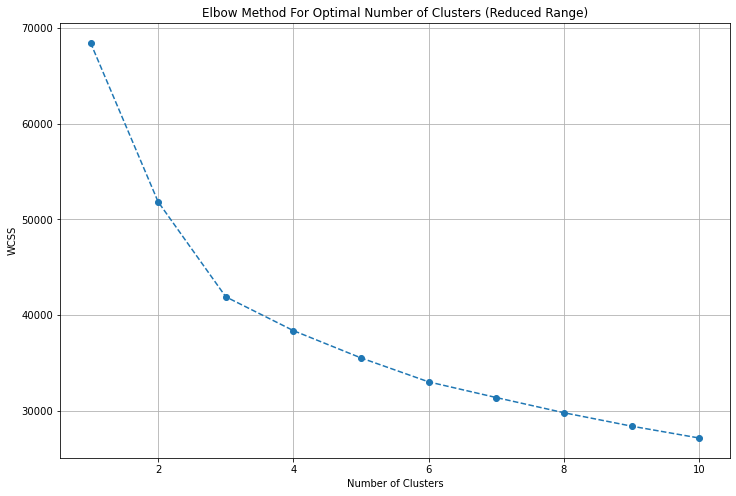

In [45]:
plt.figure(figsize=(12, 8))
plt.plot(range(1,11), wcss_reduced, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal Number of Clusters (Reduced Range)')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()


In [46]:
n_clusters = 3

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(scaled_data)

cluster_assignments = kmeans.predict(scaled_data)


In [48]:
df=df.iloc[:,:-18]

,property_type,society,sector,price,price_per_sqft,area,areaWithType
0,flat,kiran residency,sector 56,1.54,8324.0,1850.0,Super Built up area 2000(185.81 sq.m.)Built Up...
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.)
2,flat,m3m golfestate,sector 65,13.20,12000.0,11000.0,Carpet area: 11000 (1021.93 sq.m.)
3,flat,the close north,sector 50,2.70,10364.0,2605.0,Super Built up area 2605(242.01 sq.m.)Built Up...
4,flat,dlf new town heights,sector 90,1.25,6476.0,1930.0,Super Built up area 1930(179.3 sq.m.)Built Up ...
5,flat,ss,sector 85,1.19,7121.0,1671.0,Super Built up area 1671(155.24 sq.m.)Built Up...
6,flat,ss the leaf,sector 85,1.12,6453.0,1736.0,Super Built up area 1741(161.74 sq.m.)Built Up...
7,flat,suncity platinum towers,sector 28,6.00,22346.0,2685.0,Carpet area: 2685 (249.44 sq.m.)
8,flat,shapoorji pallonji joyville gurugram,sector 102,1.95,10529.0,1852.0,Super Built up area 1852(172.06 sq.m.)
9,house,emaar mgf marbella,sector 66,NaN,NaN,NaN,Plot area 350(292.64 sq.m.)


In [49]:
df['furnishing_type'] = cluster_assignments

In [51]:
df.sample(5)[['furnishDetails','furnishing_type']]

,furnishDetails,furnishing_type
3198,"['1 Light', 'No AC', 'No Bed', 'No Chimney', '...",0
150,"['2 AC', 'No Bed', 'No Chimney', 'No Curtains'...",0
57,"['2 Fan', '10 Light', '3 Wardrobe', 'No AC', '...",0
2031,"['12 Fan', '1 Fridge', '1 Exhaust Fan', '12 Ge...",2
953,"['1 Modular Kitchen', 'No AC', 'No Bed', 'No C...",0


In [52]:

df[['society','features']].sample(5)

,society,features
1369,alpha corp gurgaonone,"['Intercom Facility', 'Lift(s)', 'Maintenance ..."
463,signature global park 4,"['Security / Fire Alarm', 'Feng Shui / Vaastu ..."
3153,independent,"['High Ceiling Height', 'Maintenance Staff', '..."
2088,antriksh heights,"['Power Back-up', 'Lift(s)', 'Swimming Pool', ..."
241,unitech deerwood chase,"['Centrally Air Conditioned', 'Water purifier'..."


In [54]:
df['features'].isnull().sum()

635

In [56]:
import pandas as pd
app_df = pd.read_csv('appartments.csv')
app_df.head(2)

,PropertyName,PropertySubName,NearbyLocations,LocationAdvantages,Link,PriceDetails,TopFacilities
0,Smartworld One DXP,"2, 3, 4 BHK Apartment in Sector 113, Gurgaon","['Bajghera Road', 'Palam Vihar Halt', 'DPSG Pa...","{'Bajghera Road': '800 Meter', 'Palam Vihar Ha...",https://www.99acres.com/smartworld-one-dxp-sec...,"{'2 BHK': {'building_type': 'Apartment', 'area...","['Swimming Pool', 'Salon', 'Restaurant', 'Spa'..."
1,M3M Crown,"3, 4 BHK Apartment in Sector 111, Gurgaon","['DPSG Palam Vihar Gurugram', 'The NorthCap Un...","{'DPSG Palam Vihar Gurugram': '1.4 Km', 'The N...",https://www.99acres.com/m3m-crown-sector-111-g...,"{'3 BHK': {'building_type': 'Apartment', 'area...","['Bowling Alley', 'Mini Theatre', 'Manicured G..."


In [57]:
app_df['PropertyName'] = app_df['PropertyName'].str.lower()
temp_df = df[df['features'].isnull()]


In [58]:
app_df.head(
)

,PropertyName,PropertySubName,NearbyLocations,LocationAdvantages,Link,PriceDetails,TopFacilities
0,smartworld one dxp,"2, 3, 4 BHK Apartment in Sector 113, Gurgaon","['Bajghera Road', 'Palam Vihar Halt', 'DPSG Pa...","{'Bajghera Road': '800 Meter', 'Palam Vihar Ha...",https://www.99acres.com/smartworld-one-dxp-sec...,"{'2 BHK': {'building_type': 'Apartment', 'area...","['Swimming Pool', 'Salon', 'Restaurant', 'Spa'..."
1,m3m crown,"3, 4 BHK Apartment in Sector 111, Gurgaon","['DPSG Palam Vihar Gurugram', 'The NorthCap Un...","{'DPSG Palam Vihar Gurugram': '1.4 Km', 'The N...",https://www.99acres.com/m3m-crown-sector-111-g...,"{'3 BHK': {'building_type': 'Apartment', 'area...","['Bowling Alley', 'Mini Theatre', 'Manicured G..."
2,adani brahma samsara vilasa,"Land, 3, 4 BHK Independent Floor in Sector 63,...","['AIPL Business Club Sector 62', 'Heritage Xpe...","{'AIPL Business Club Sector 62': '2.7 Km', 'He...",https://www.99acres.com/adani-brahma-samsara-v...,{'3 BHK': {'building_type': 'Independent Floor...,"['Terrace Garden', 'Gazebo', 'Fountain', 'Amph..."
3,sobha city,"2, 3, 4 BHK Apartment in Sector 108, Gurgaon","['The Shikshiyan School', 'WTC Plaza', 'Luxus ...","{'The Shikshiyan School': '2.9 KM', 'WTC Plaza...",https://www.99acres.com/sobha-city-sector-108-...,"{'2 BHK': {'building_type': 'Apartment', 'area...","['Swimming Pool', 'Volley Ball Court', 'Aerobi..."
4,signature global city 93,"2, 3 BHK Independent Floor in Sector 93 Gurgaon","['Pranavananda Int. School', 'DLF Site central...","{'Pranavananda Int. School': '450 m', 'DLF Sit...",https://www.99acres.com/signature-global-city-...,{'2 BHK': {'building_type': 'Independent Floor...,"['Mini Theatre', 'Doctor on Call', 'Concierge ..."


In [59]:
temp_df.head(
)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.),1,1,0,not available,1.0,NaN,Relatively New,NaN,[],NaN,NaN,33.0,NaN,0,0,0,0,0,0
11,house,independent,sector 13,9.00,100000.0,900.0,Plot area 900(83.61 sq.m.),10,5,3+,not available,4.0,NaN,Old Property,"['Sheetla Mata Mandir', 'Hsbc bank ATM', 'Hdfc...","['1 Geyser', '2 AC', 'No Bed', 'No Chimney', '...",NaN,NaN,900.0,NaN,0,0,0,0,0,0
12,house,independent,sector 2,0.70,7777.0,900.0,Built Up area: 900 (83.61 sq.m.),1,1,0,not available,1.0,NaN,Undefined,"['Palam triangle', 'HUDA Sector 23 Market', 'P...","['1 Light', 'No AC', 'No Bed', 'No Chimney', '...",NaN,NaN,900.0,NaN,0,0,0,0,0,0
35,flat,conscient elevate,sector 59,4.25,18518.0,2295.0,Super Built up area 2295(213.21 sq.m.),3,4,3,not available,3.0,NaN,Under Construction,"['Rapid Metro Station Sector 55', 'Paras Trini...",[],NaN,2295.0,NaN,NaN,0,0,0,0,0,0
37,house,independent,sector 13,0.45,4808.0,936.0,Built Up area: 936 (86.96 sq.m.),1,1,0,not available,1.0,NaN,Undefined,NaN,NaN,NaN,NaN,936.0,NaN,0,0,0,0,0,0


In [60]:
x = temp_df.merge(app_df,left_on='society',right_on='PropertyName',how='left')['TopFacilities']


In [61]:
df.loc[temp_df.index,'features'] = x.values


In [62]:
df['features'].isnull().sum()


481

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer
import ast

In [65]:
df['features_list'] = df['features'].apply(lambda x: ast.literal_eval(x) if pd.notnull(x) and x.startswith('[') else [])

mlb = MultiLabelBinarizer()
features_binary_matrix = mlb.fit_transform(df['features_list'])

features_binary_df = pd.DataFrame(features_binary_matrix, columns=mlb.classes_)

In [66]:
features_binary_df.sample(5)


,24/7 Power Backup,24/7 Water Supply,24x7 Security,ATM,Aerobics Centre,Air Hockey,Airy Rooms,Amphitheatre,Automated Car Wash,Badminton Court,Bank Attached Property,Banquet Hall,Bar/Chill-Out Lounge,Barbecue,Basketball Court,Beach Volley Ball Court,Billiards,Bowling Alley,Bus Shelter,Business Lounge,CCTV Camera Security,Cafeteria,Car Parking,Car wash area,Card Room,Centrally Air Conditioned,Changing Area,Children's Play Area,Cigar Lounge,Clinic,Club House,Club house / Community Center,Community Hall,Concierge Service,Conference room,Creche/Day care,Cricket Pitch,Doctor on Call,Earthquake Resistant,Entrance Lobby,False Ceiling Lighting,Feng Shui / Vaastu Compliant,Fire Fighting Systems,Fitness Centre / GYM,Flower Garden,Food Court,Foosball,Football,Fountain,Gated Community,Gazebo,Golf Course,Grocery Shop,Gymnasium,High Ceiling Height,High Speed Elevators,Infinity Pool,Intercom Facility,Internal Street Lights,Internet/wi-fi connectivity,Jacuzzi,Jogging Track,Landscape Garden,Laundry,Lawn Tennis Court,Library,Lift(s),Lounge,Low Density Society,Maintenance Staff,Manicured Garden,Medical Centre,Milk Booth,Mini Theatre,Multipurpose Court,Multipurpose Hall,Natural Light,Natural Pond,No open drainage around,Park,Party Lawn,Pergola,Piped Gas,Piped-gas,Pool Table,Power Back up Lift,Power Back-up,Private Garden / Terrace,Property Staff,RO System,Rain Water Harvesting,Reading Lounge,Recently Renovated,Reflexology Park,Restaurant,Salon,Sauna,School,Security / Fire Alarm,Security Personnel,Separate entry for servant room,Sewage Treatment Plant,Shopping Centre,Skating Rink,Solar Lighting,Solar Water Heating,Spa,Spacious Interiors,Squash Court,Steam Room,Sun Deck,Swimming Pool,Temple,Terrace Garden,Theatre,Toddler Pool,Valet Parking,Vastu Compliant,Video Door Security,Visitor Parking,Visitors Parking,Volley Ball Court,Waiting Lounge,Waste Disposal,Water Softener Plant,Water Storage,Water purifier,Water softening plant,Wi-Fi Connectivity,Yoga/Meditation Area
1514,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1847,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
217,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0
1050,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0
3723,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0


In [67]:
features_binary_df.shape


(3803, 130)

In [76]:
#here weights are assigned to each fascility basedon how luxurious the fascility is
weights = {
    '24/7 Power Backup': 8,
    '24/7 Water Supply': 4,
    '24x7 Security': 7,
    'ATM': 4,
    'Aerobics Centre': 6,
    'Airy Rooms': 8,
    'Amphitheatre': 7,
    'Badminton Court': 7,
    'Banquet Hall': 8,
    'Bar/Chill-Out Lounge': 9,
    'Barbecue': 7,
    'Basketball Court': 7,
    'Billiards': 7,
    'Bowling Alley': 8,
    'Business Lounge': 9,
    'CCTV Camera Security': 8,
    'Cafeteria': 6,
    'Car Parking': 6,
    'Card Room': 6,
    'Centrally Air Conditioned': 9,
    'Changing Area': 6,
    "Children's Play Area": 7,
    'Cigar Lounge': 9,
    'Clinic': 5,
    'Club House': 9,
    'Concierge Service': 9,
    'Conference room': 8,
    'Creche/Day care': 7,
    'Cricket Pitch': 7,
    'Doctor on Call': 6,
    'Earthquake Resistant': 5,
    'Entrance Lobby': 7,
    'False Ceiling Lighting': 6,
    'Feng Shui / Vaastu Compliant': 5,
    'Fire Fighting Systems': 8,
    'Fitness Centre / GYM': 8,
    'Flower Garden': 7,
    'Food Court': 6,
    'Foosball': 5,
    'Football': 7,
    'Fountain': 7,
    'Gated Community': 7,
    'Golf Course': 10,
    'Grocery Shop': 6,
    'Gymnasium': 8,
    'High Ceiling Height': 8,
    'High Speed Elevators': 8,
    'Infinity Pool': 9,
    'Intercom Facility': 7,
    'Internal Street Lights': 6,
    'Internet/wi-fi connectivity': 7,
    'Jacuzzi': 9,
    'Jogging Track': 7,
    'Landscape Garden': 8,
    'Laundry': 6,
    'Lawn Tennis Court': 8,
    'Library': 8,
    'Lounge': 8,
    'Low Density Society': 7,
    'Maintenance Staff': 6,
    'Manicured Garden': 7,
    'Medical Centre': 5,
    'Milk Booth': 4,
    'Mini Theatre': 9,
    'Multipurpose Court': 7,
    'Multipurpose Hall': 7,
    'Natural Light': 8,
    'Natural Pond': 7,
    'Park': 8,
    'Party Lawn': 8,
    'Piped Gas': 7,
    'Pool Table': 7,
    'Power Back up Lift': 8,
    'Private Garden / Terrace': 9,
    'Property Staff': 7,
    'RO System': 7,
    'Rain Water Harvesting': 7,
    'Reading Lounge': 8,
    'Restaurant': 8,
    'Salon': 8,
    'Sauna': 9,
    'Security / Fire Alarm': 9,
    'Security Personnel': 9,
    'Separate entry for servant room': 8,
    'Sewage Treatment Plant': 6,
    'Shopping Centre': 7,
    'Skating Rink': 7,
    'Solar Lighting': 6,
    'Solar Water Heating': 7,
    'Spa': 9,
    'Spacious Interiors': 9,
    'Squash Court': 8,
    'Steam Room': 9,
    'Sun Deck': 8,
    'Swimming Pool': 8,
    'Temple': 5,
    'Theatre': 9,
    'Toddler Pool': 7,
    'Valet Parking': 9,
    'Video Door Security': 9,
    'Visitor Parking': 7,
    'Water Softener Plant': 7,
    'Water Storage': 7,
    'Water purifier': 7,
    'Yoga/Meditation Area': 7
}
# Calculate luxury score for each row
luxury_score = features_binary_df[list(weights.keys())].multiply(list(weights.values())).sum(axis=1)

In [78]:
df['luxury_score'] = luxury_score


In [79]:
df.head()


,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,features_list,luxury_score
0,flat,kiran residency,sector 56,1.54,8324.0,1850.0,Super Built up area 2000(185.81 sq.m.)Built Up...,3,4,3+,Servant Room,5.0,South,Old Property,"['Sector metro station', 'Sector metro station...","['3 Wardrobe', '5 Fan', '1 Exhaust Fan', '3 Ge...","['Feng Shui / Vaastu Compliant', 'Lift(s)', 'H...",2000.0,1900.0,1850.0,0,1,0,0,0,1,"[Feng Shui / Vaastu Compliant, Lift(s), High C...",98
1,house,independent,sohna road,0.07,2525.0,277.0,Plot area 33(27.59 sq.m.),1,1,0,not available,1.0,NaN,Relatively New,NaN,[],NaN,NaN,33.0,NaN,0,0,0,0,0,0,[],0
2,flat,m3m golfestate,sector 65,13.20,12000.0,11000.0,Carpet area: 11000 (1021.93 sq.m.),4,4,3,Servant Room,13.0,North,Moderately Old,"['Sector 54 Chowk Metro Station', 'Sahara Mall...","['4 Fan', '8 Light', 'No AC', 'No Bed', 'No Ch...","['Power Back-up', 'Intercom Facility', 'Lift(s...",NaN,NaN,11000.0,0,1,0,0,0,0,"[Power Back-up, Intercom Facility, Lift(s), Sw...",60
3,flat,the close north,sector 50,2.70,10364.0,2605.0,Super Built up area 2605(242.01 sq.m.)Built Up...,3,3,3+,Servant Room,6.0,East,Moderately Old,"['Sector 55-56 Metro Station', 'Eros City Squa...","['5 Fan', '15 Light', 'No AC', 'No Bed', 'No C...","['Centrally Air Conditioned', 'Water purifier'...",2605.0,2400.0,2200.0,0,1,0,0,0,0,"[Centrally Air Conditioned, Water purifier, Se...",174
4,flat,dlf new town heights,sector 90,1.25,6476.0,1930.0,Super Built up area 1930(179.3 sq.m.)Built Up ...,3,3,3+,"Pooja Room,Servant Room",6.0,West,Relatively New,"['Manish Gallexie 91', 'NH-8 IMT Manesar', 'RH...",NaN,"['Security / Fire Alarm', 'Power Back-up', 'Fe...",1930.0,1929.0,1928.0,0,1,0,1,0,0,"[Security / Fire Alarm, Power Back-up, Feng Sh...",136


In [80]:
df.drop(columns=['nearbyLocations','furnishDetails','features','features_list','additionalRoom'],inplace=True)




In [81]:
df.sample(5)



,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
1233,flat,siddhartha apartment,sector 95,0.72,3664.0,1965.0,Super Built up area 1965(182.55 sq.m.)Built Up...,3,3,2,4.0,East,Relatively New,1965.0,1800.0,1600.0,0,0,0,0,1,0,21
731,flat,emaar mgf emerald floors premier,sector 65,2.90,14683.0,1975.0,Super Built up area 1975(183.48 sq.m.),4,4,3+,4.0,North-East,Relatively New,1975.0,NaN,NaN,1,1,0,0,0,1,152
2401,flat,sahara grace,sector 28,5.50,14612.0,3764.0,Super Built up area 3764(349.69 sq.m.),4,5,3+,5.0,East,Moderately Old,3764.0,NaN,NaN,0,1,0,0,1,1,8
2941,flat,paras dews,sector 106,1.50,6369.0,2355.0,Super Built up area 2355(218.79 sq.m.)Built Up...,4,6,3+,11.0,North-West,Relatively New,2355.0,1535.0,1403.0,0,1,0,0,0,0,174
733,flat,bptp astaire gardens,sector 70a,1.20,7058.0,1700.0,Super Built up area 1700(157.94 sq.m.)Built Up...,3,3,3+,2.0,NaN,Relatively New,1700.0,1450.0,NaN,0,0,0,0,0,2,38


In [82]:
df.to_csv('gurgaon_properties_cleaned2.csv',index=False)
